In [ ]:
import numpy as np
import cv2 as cv
import glob
import matplotlib.pyplot as plt
import os
from google.colab.patches import cv2_imshow

In [ ]:
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objpoints = []
imgpoints = []

rows = 6
columns = 4

objp = np.zeros((1, rows * columns, 3), np.float32)
objp[0,:,:2] = np.mgrid[0:rows, 0:columns].T.reshape(-1, 2)

In [ ]:
root = 'drive/MyDrive/CV_HW2/images'
folder = os.listdir(root)
images_paths = []
for fp in folder:
    images_paths.append(os.path.join(root, fp))
print(images_paths)

['drive/MyDrive/CV_HW2/images/69f7134a-0903-46a7-8e03-8d911087a2ff.jpg', 'drive/MyDrive/CV_HW2/images/77fe7f7d-d42c-4fea-8df6-8aadaba4f28b.jpg', 'drive/MyDrive/CV_HW2/images/15eb4b35-79e3-4fe7-8d50-afb4d2f11a92.jpg', 'drive/MyDrive/CV_HW2/images/191a20c6-e6c0-4486-85c2-6ab2ba94e206.jpg', 'drive/MyDrive/CV_HW2/images/e9bad8ad-4027-443f-a338-40b597e32fa0.jpg', 'drive/MyDrive/CV_HW2/images/95f1bd4e-3a8e-4628-ba16-10f25e0efe38.jpg', 'drive/MyDrive/CV_HW2/images/00b9cfa4-e7eb-4b24-81ca-eb63bde195c5.jpg', 'drive/MyDrive/CV_HW2/images/454632fc-5759-416e-8a65-c8ec287fcd26.jpg', 'drive/MyDrive/CV_HW2/images/f0b9c600-2379-4591-b8eb-4eaba2a6e041.jpg', 'drive/MyDrive/CV_HW2/images/00a08bad-7c16-4f09-b511-2cae0d95d6a6.jpg', 'drive/MyDrive/CV_HW2/images/7bf7cacc-dfaf-4cbe-a97d-7dbe0f096b3f.jpg', 'drive/MyDrive/CV_HW2/images/4e44c892-c846-437e-9a3a-dfd6c5de2475.jpg', 'drive/MyDrive/CV_HW2/images/5751d676-1806-4ec0-9a85-a05922a4d033.jpg', 'drive/MyDrive/CV_HW2/images/177ae0fc-3fa8-40fe-b310-4470e31d93

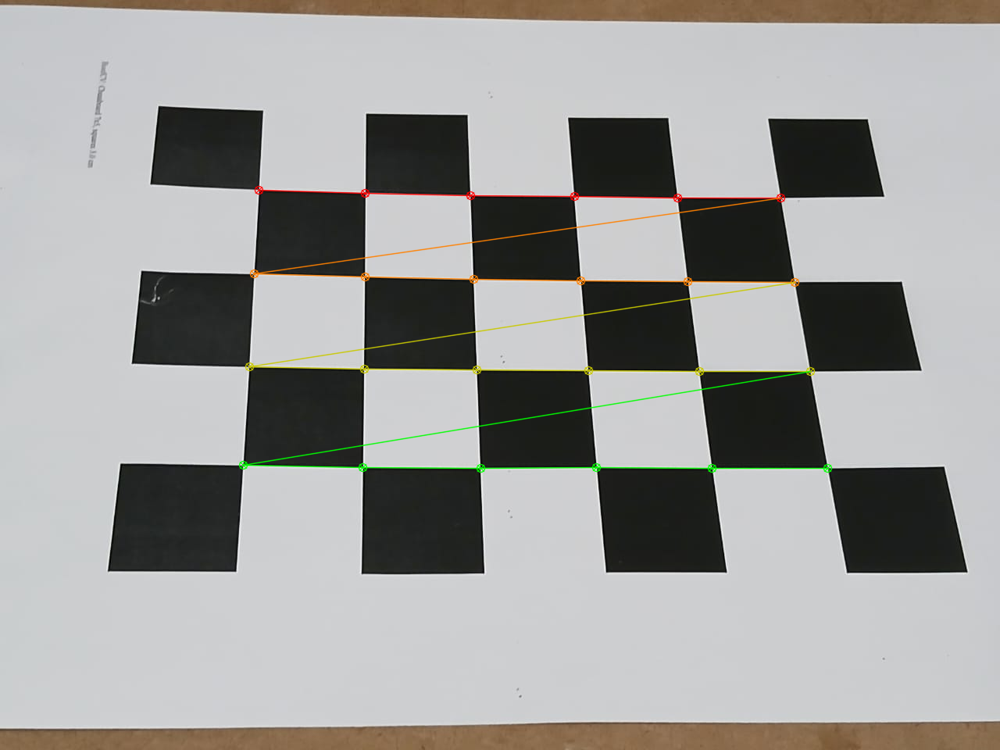

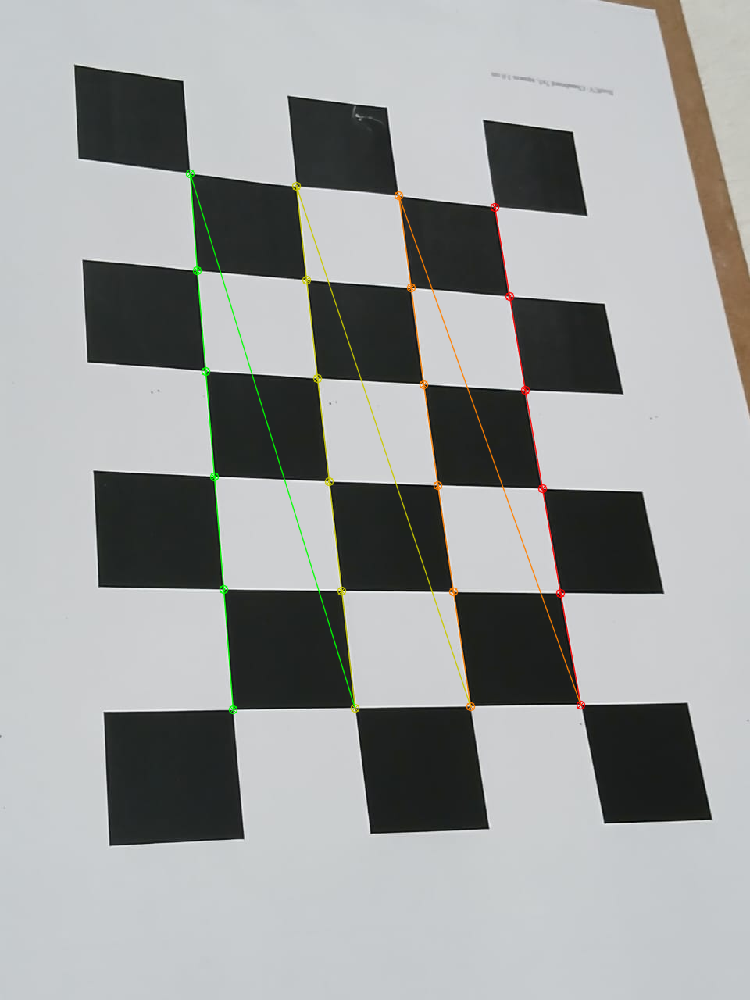

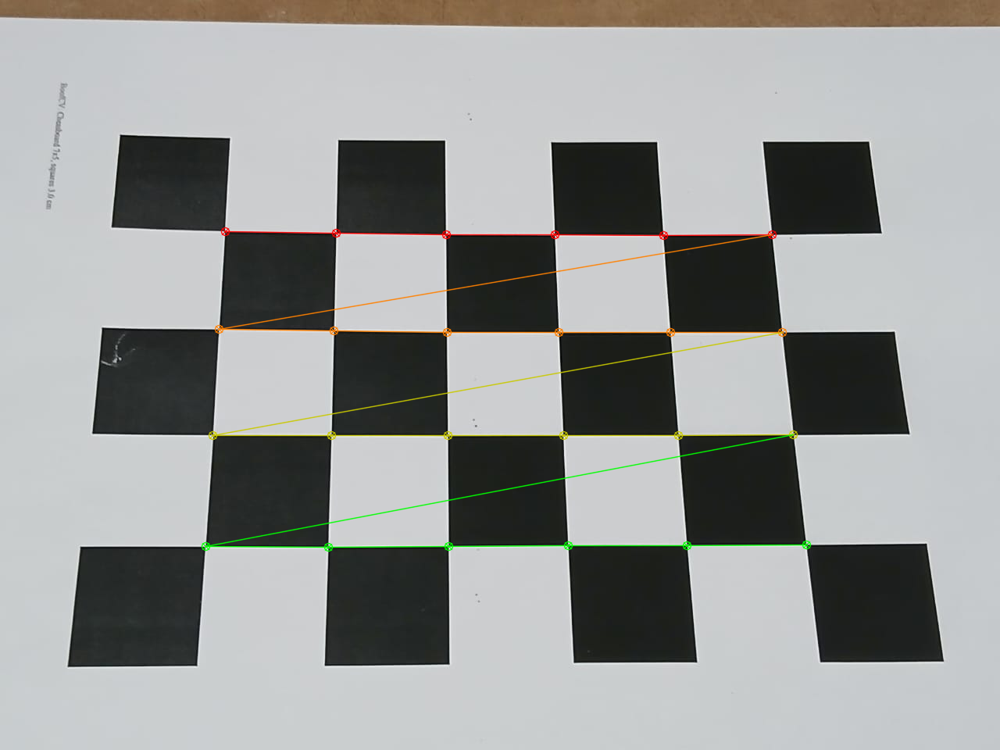

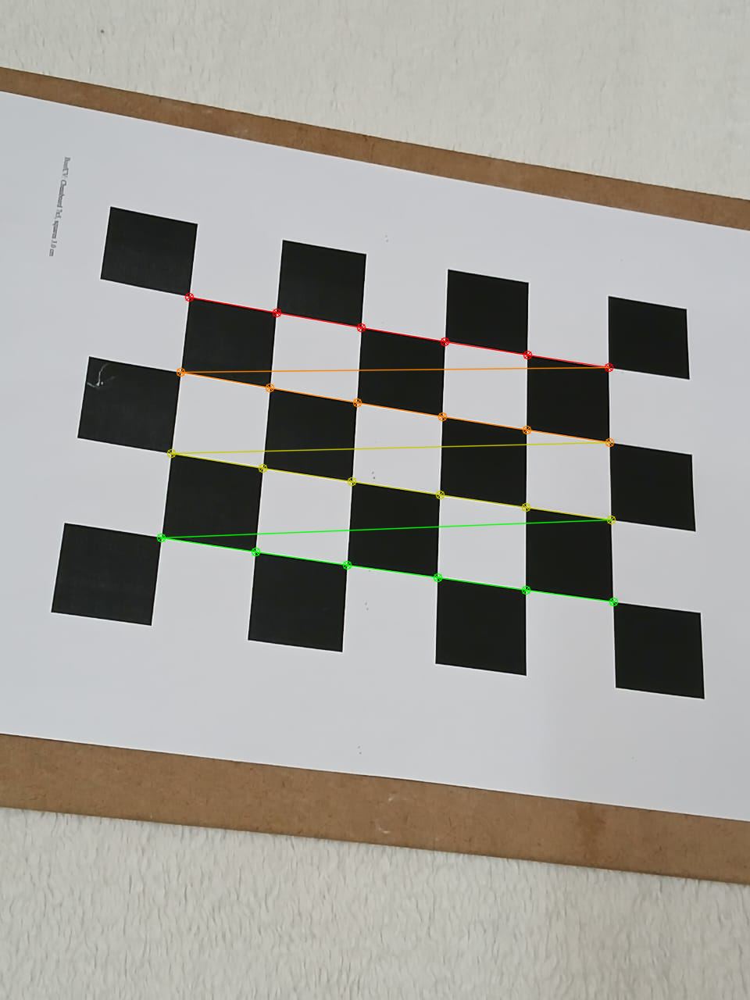

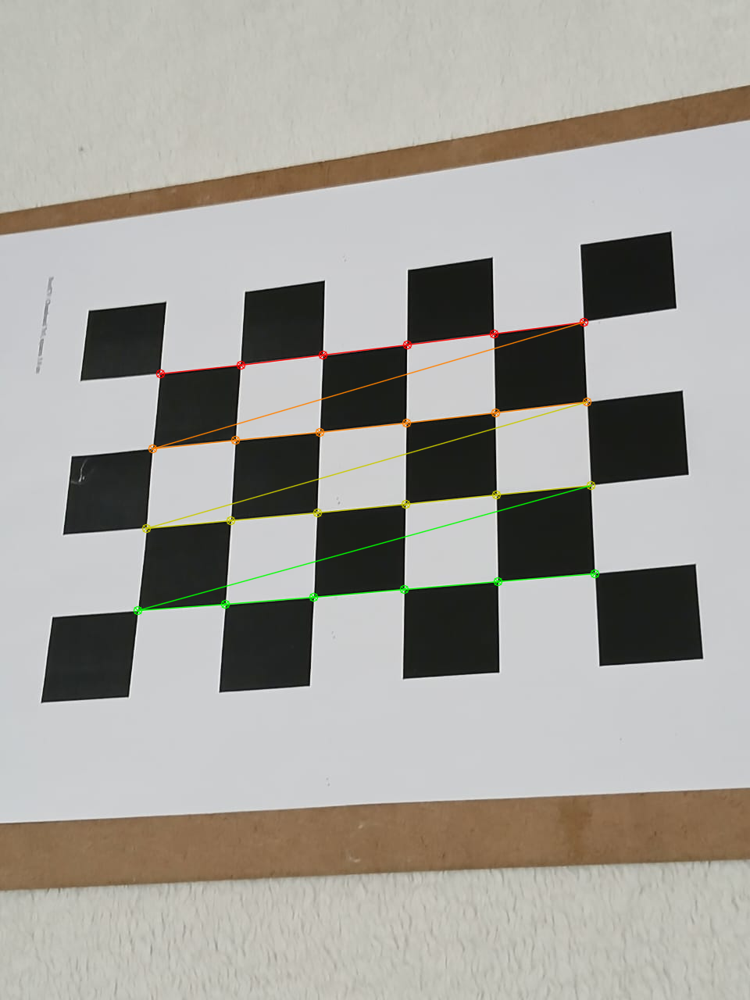

...

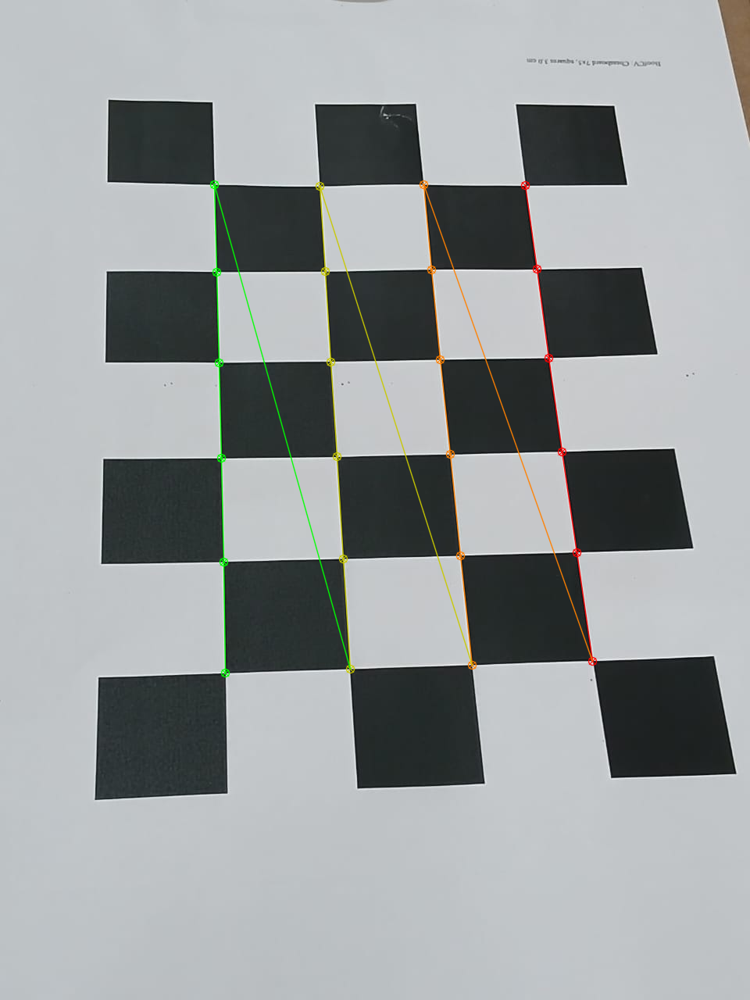

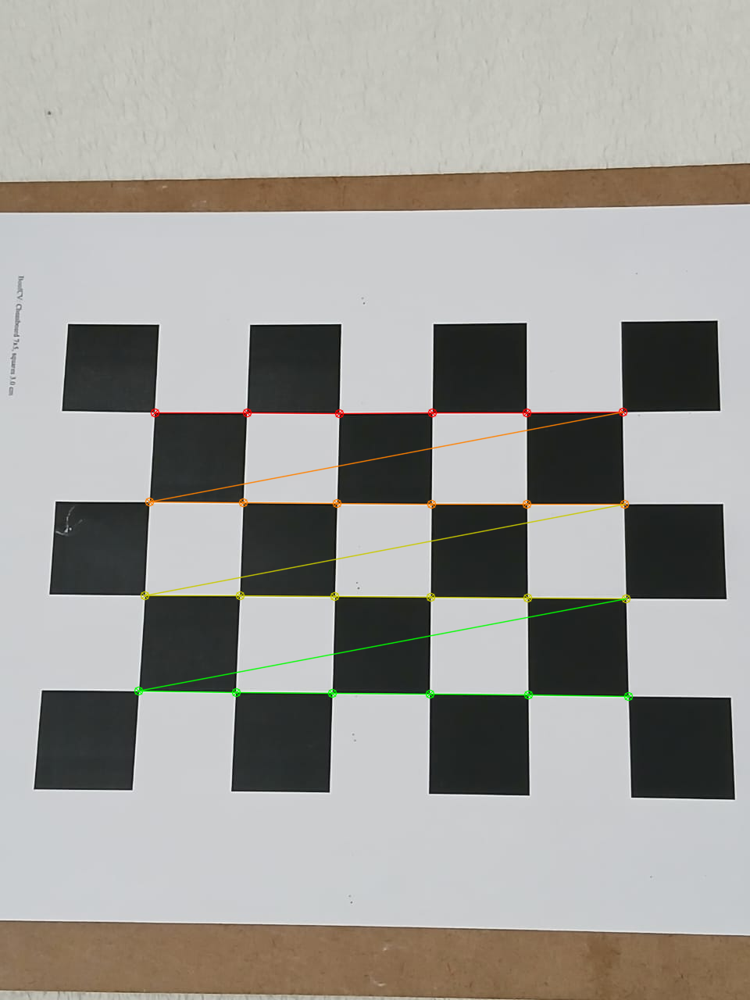

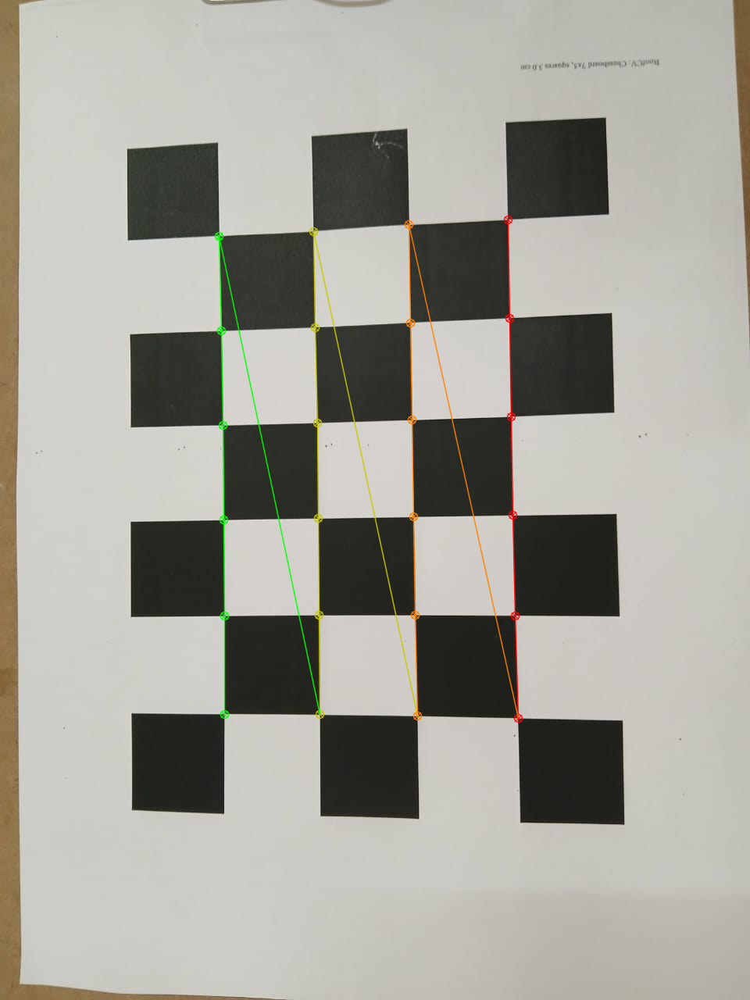

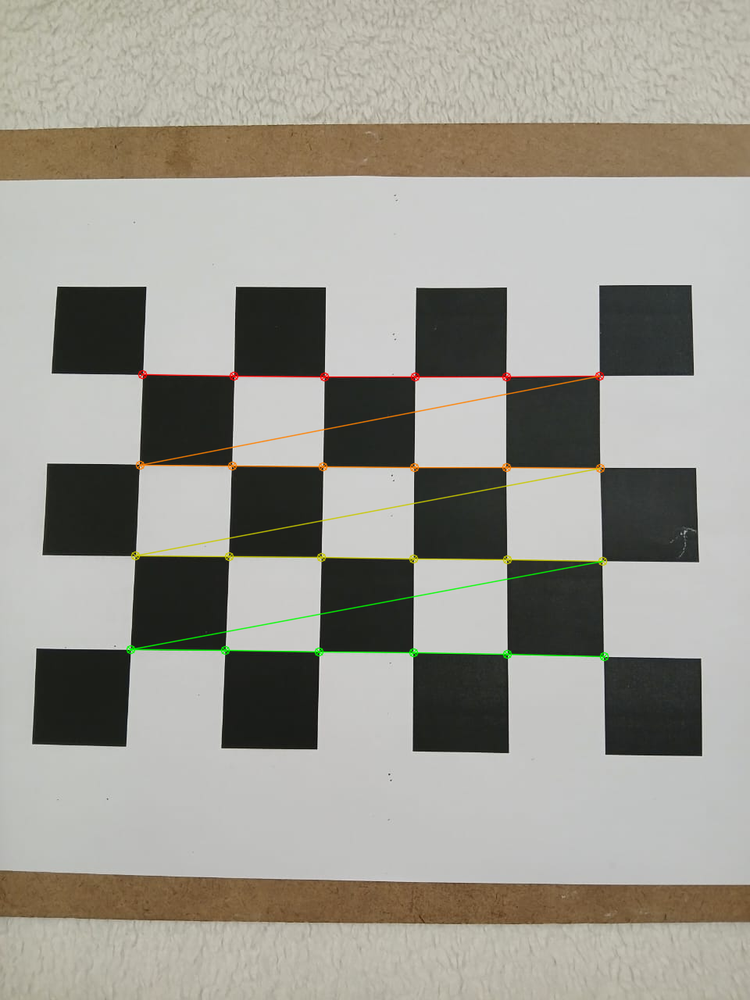

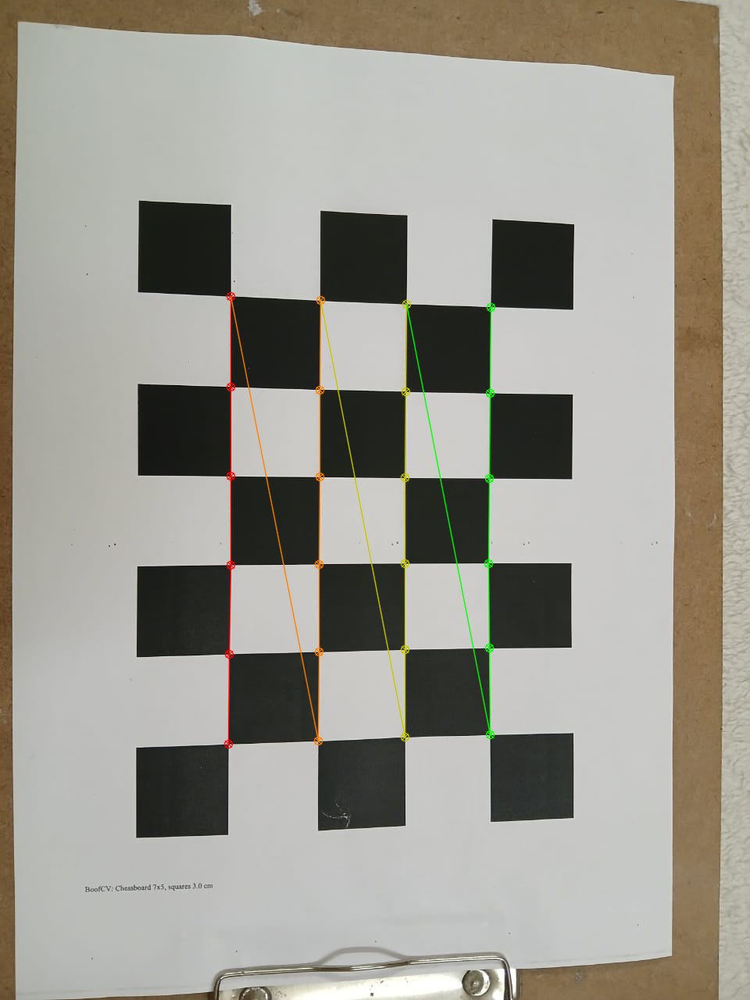

In [ ]:
for fname in images_paths:
    img = cv.imread(fname)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    #print(img, gray)

    # Find the chess board corners
    ret, corners = cv.findChessboardCorners(gray, (rows, columns), None)
    #print(ret, corners)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

    cv.drawChessboardCorners(img, (6, 4), corners2, ret)
    cv2_imshow(img)
    cv.waitKey(500)

cv.destroyAllWindows()

In [ ]:
ret, mtx, dist, rvecs, tvecs  = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

print(" Camera matrix:")
print(mtx)

fx = mtx[0, 0]
fy = mtx[1, 1]
cx = mtx[0, 2]
cy = mtx[1, 2]
s = mtx[0, 1]

print("\nFocal length (fx, in pixels):", fx)
print("Focal length (fy, in pixels):", fy)
print("Principal point (cx, cy, in pixels): ({}, {})".format(cx, cy))
print("Skew parameter:", s)

print("RMS Reprojection Error:")
print(ret)

print("\n Distortion coefficient:")
print(dist)

print("\n Rotation Vectors:")
print(rvecs)

print("\n Translation Vectors:")
print(tvecs)

 Camera matrix:
[[1.86349876e+03 0.00000000e+00 4.68234969e+02]
 [0.00000000e+00 1.86021775e+03 5.87379215e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Focal length (fx, in pixels): 1863.4987551658044
Focal length (fy, in pixels): 1860.2177517430914
Principal point (cx, cy, in pixels): (468.23496946072356, 587.3792145211783)
Skew parameter: 0.0
RMS Reprojection Error:
2.179318198285322

 Distortion coefficient:
[[ 3.98439392e-01 -5.41592723e+00 -5.30244941e-03 -5.95353510e-03
   1.91257133e+01]]

 Rotation Vectors:
(array([[-0.5260311 ],
       [-0.00924322],
       [ 0.00830635]]), array([[-0.61301299],
       [ 0.07890199],
       [ 1.48797854]]), array([[-0.38879902],
       [ 0.01023163],
       [ 0.00642834]]), array([[-0.46901342],
       [-0.21214107],
       [ 0.10595139]]), array([[-0.4648468 ],
       [ 0.26374784],
       [-0.04209609]]), array([[-0.01734941],
       [-0.28329269],
       [-0.0273258 ]]), array([[0.02179978],
       [0.3748336 ],
       [1.52234853

In [ ]:
print(len(rvecs), len(tvecs))

25 25


#PART 3

In [ ]:
i = 0
for fname in images_paths[:5]:
    img = cv.imread(fname)
    h, w = img.shape[:2]
    newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 0.5, (w,h))

    # undistort
    dst = cv.undistort(img, mtx, dist, None, newcameramtx)

    # crop the image
    x, y, w, h = roi
    dst = dst[y:y+h, x:x+w]
    path = 'calibresult'+str(i)+'.png'
    cv.imwrite(path, dst)
    i += 1


#PART 4

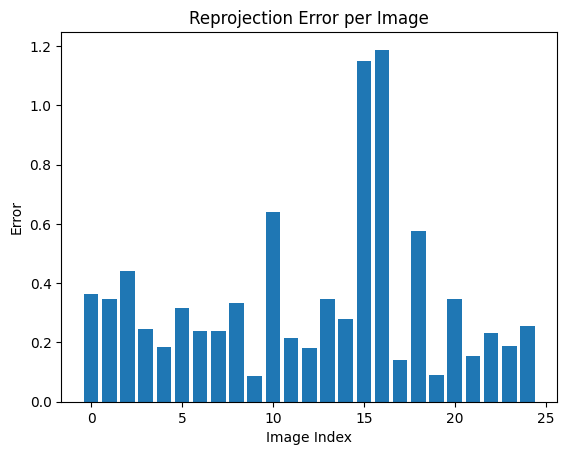

Mean reprojection error: 0.35083158802585424
Standard deviation of reprojection error: 0.27351369750979293


In [ ]:
errors = []
for i in range(len(objpoints)):
    imgpoints2, _ = cv.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv.norm(imgpoints[i], imgpoints2, cv.NORM_L2)/len(imgpoints2)
    errors.append(error)


plt.bar(range(len(errors)), errors)
plt.title('Reprojection Error per Image')
plt.xlabel('Image Index')
plt.ylabel('Error')
plt.show()

mean_error = np.mean(errors)
std_error = np.std(errors)
print(f"Mean reprojection error: {mean_error}")
print(f"Standard deviation of reprojection error: {std_error}")

#PART 5

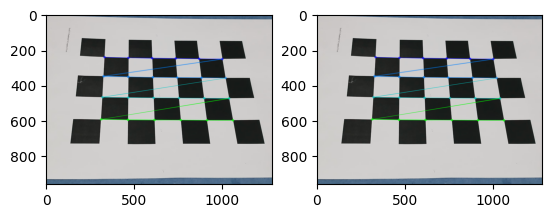

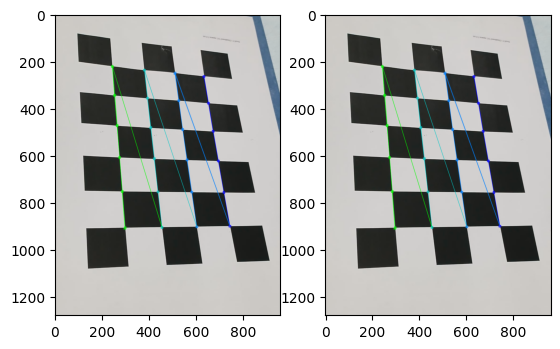

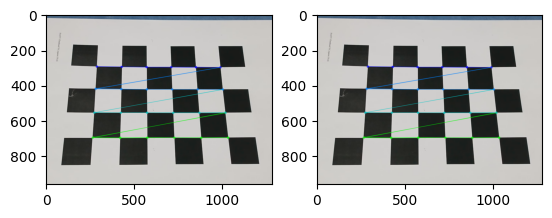

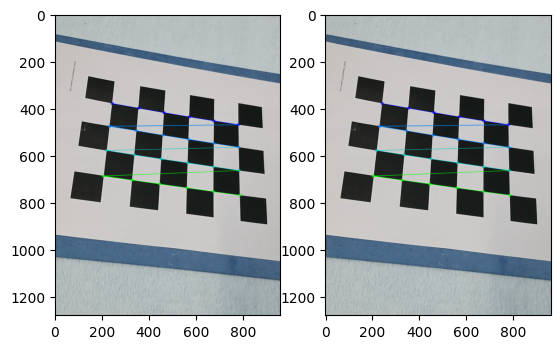

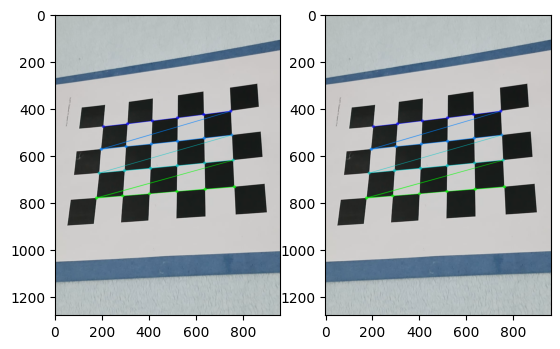

...

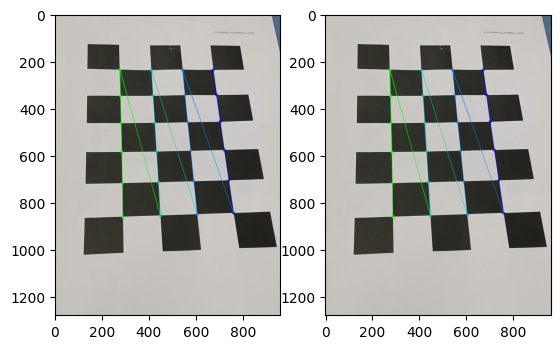

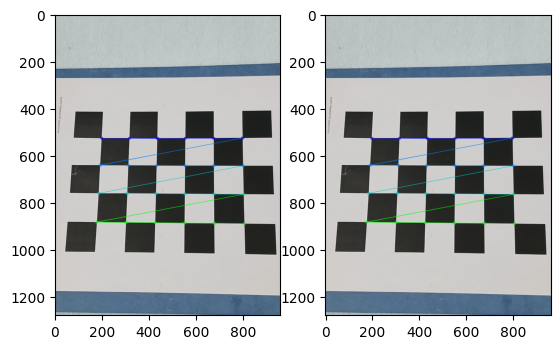

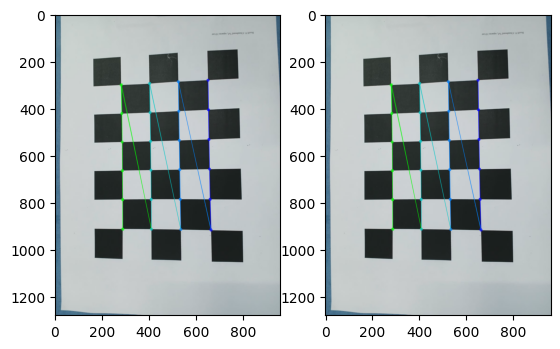

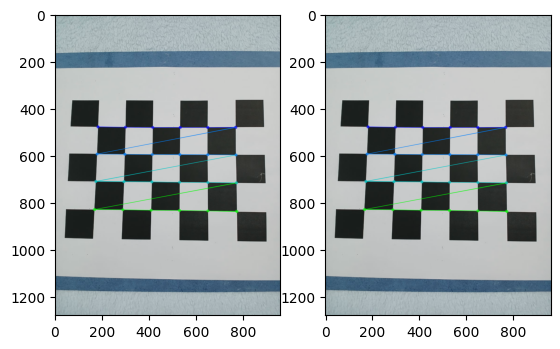

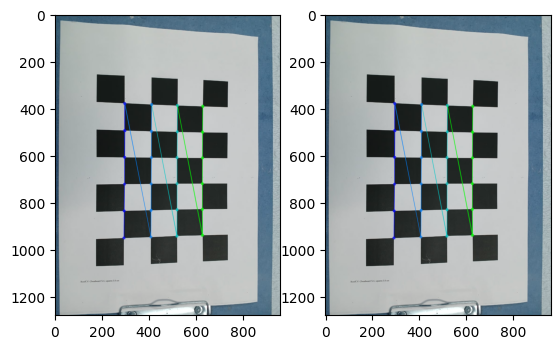

In [ ]:
for i, fname in enumerate(images_paths):
    img = cv.imread(fname)
    imgpoints2, _ = cv.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    img = cv.drawChessboardCorners(img, (rows, columns), imgpoints[i], True)
    img2 = cv.drawChessboardCorners(img, (rows, columns), imgpoints2.reshape(-1, 2), True)


    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.subplot(1, 2, 2)
    plt.imshow(img2)

    plt.show()


#PART 6

In [ ]:
normals = []
for rvec in rvecs:
    R, _ = cv.Rodrigues(rvec)
    normal = np.dot(R, np.array([0, 0, 1]))
    normals.append(normal)
    camera_normal = normal / np.linalg.norm(normal)
    print(normal)

[-0.01095732  0.50205429  0.86476669]
[-0.31663138  0.42720158  0.84690222]
[0.00874156 0.3791005  0.92531421]
[-0.22678905  0.43673712  0.87053284]
[0.26084588 0.43747742 0.86056547]
[-0.27923409  0.02095972  0.95999428]
[0.25251664 0.21754209 0.94282065]
[-0.28922772  0.20795449  0.93439941]
[-0.03280991  0.43382084  0.90040157]
[ 0.07807442 -0.00636224  0.99692723]
[-0.01539634  0.28926795  0.95712434]
[0.03961089 0.22319412 0.97396887]
[-0.09830058  0.06827471  0.99281195]
[0.02940283 0.41649326 0.90866321]
[-0.1997548   0.19339569  0.96057073]
[0.07950731 0.3755124  0.92340079]
[0.43322588 0.14667514 0.88927034]
[ 0.26118201 -0.20739606  0.94274643]
[0.2176199  0.45763891 0.86209524]
[-0.10088459 -0.16189419  0.9816377 ]
[-0.06764186  0.4928382   0.8674878 ]
[0.06829701 0.25451295 0.96465469]
[0.18093924 0.05980591 0.9816742 ]
[0.05246339 0.16118055 0.98552951]
[-0.18407186  0.01392832  0.9828141 ]
